In [1]:
from src.core import log, supabase
from src.preprocess import processing_text
from src.training.train_topics_model import text_pipeline, find_and_train_optimal_model, get_keywords_from_labels, calculate_separation_score, calculate_coherence_score
from src.utils.visualize import create_cluster_plot
from sklearn.metrics import silhouette_score
from sklearn.cluster._hdbscan.hdbscan import HDBSCAN
from sklearn.mixture import GaussianMixture
from gensim.corpora.dictionary import Dictionary
from gensim.models import LdaMulticore
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from collections import Counter
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from umap import UMAP
import numpy as np


/home/kiuyha/Documents/Surabaya-Opinion-Analytics/venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[nltk_data] Downloading package stopwords to /home/kiuyha/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
2025-11-27 07:26:34,192 - INFO - Fetched TLD list successfully.


# Load all data from Supabase

In [29]:
# we use pagination method since the supabase only load 1000 tweets at a time in default (could be increased but using pagination is more reliable)
all_tweets = []
page_size = 1000
current_page = 0

while True:
    # Fetch one page of data
    response = supabase.table('tweets') \
        .select('id', 'text_content') \
        .order('id', desc=False) \
        .limit(page_size) \
        .offset(current_page * page_size) \
        .execute()
    
    page_of_tweets = response.data        
    if not page_of_tweets:
        break
    
    # Add the fetched tweets to our main list and go to the next page
    all_tweets.extend(page_of_tweets)
    current_page += 1

if not all_tweets:
    raise Exception("No tweets found in Supabase")

log.info(f"Loaded {len(all_tweets)} tweets from Supabase.")
df = pd.DataFrame(all_tweets)

2025-11-27 07:34:09,033 - INFO - HTTP Request: GET https://viiteznydvsekvbqkimg.supabase.co/rest/v1/tweets?select=id%2Ctext_content&order=id.asc&limit=1000&offset=0 "HTTP/2 200 OK"
2025-11-27 07:34:09,489 - INFO - HTTP Request: GET https://viiteznydvsekvbqkimg.supabase.co/rest/v1/tweets?select=id%2Ctext_content&order=id.asc&limit=1000&offset=1000 "HTTP/2 200 OK"
2025-11-27 07:34:10,731 - INFO - HTTP Request: GET https://viiteznydvsekvbqkimg.supabase.co/rest/v1/tweets?select=id%2Ctext_content&order=id.asc&limit=1000&offset=2000 "HTTP/2 200 OK"
2025-11-27 07:34:10,998 - INFO - HTTP Request: GET https://viiteznydvsekvbqkimg.supabase.co/rest/v1/tweets?select=id%2Ctext_content&order=id.asc&limit=1000&offset=3000 "HTTP/2 200 OK"
2025-11-27 07:34:11,166 - INFO - HTTP Request: GET https://viiteznydvsekvbqkimg.supabase.co/rest/v1/tweets?select=id%2Ctext_content&order=id.asc&limit=1000&offset=4000 "HTTP/2 200 OK"
2025-11-27 07:34:11,401 - INFO - HTTP Request: GET https://viiteznydvsekvbqkimg.sup

# Preprocessing

In [30]:
df['light_processed_text'] = df['text_content'].apply(lambda x: processing_text(x, level='light'))
df['hard_processed_text'] = df['text_content'].apply(lambda x: processing_text(x, level='hard'))

## Distribution word

In [31]:
stages = {
    'Original': 'text_content',
    'Light': 'light_processed_text',
    'Hard': 'hard_processed_text'
}

# Calculate word counts (WC)
for name, col in stages.items():
    df[f'WC_{name}'] = df[col].astype(str).apply(lambda x: len(x.split()))

df

,id,text_content,light_processed_text,hard_processed_text,WC_Original,WC_Light,WC_Hard
0,1001430064590880769,"Pelanggan yang terhormat,\n\nTerima kasih tela...","Pelanggan yang terhormat, Terima kasih telah m...",pelangan terhormat terima kasih pelangan setia...,25,24,16
1,1001641427460276225,(2). facebook: Sapawarga Kota Surabaya atau di...,(2). facebook: Sapawarga Kota Surabaya atau di...,facebok sapawarga kota instagram terima kasih,12,12,6
2,1003261010306744320,"Malam, Mas Dicky. Terkait stiker T-Cash untuk ...","Malam, Mas Dicky. Terkait stiker T-Cash untuk ...",malam dicky terkait stiker cash pelangan telko...,30,30,21
3,1003261271737864192,"dickyp71 Malam, Mas Dicky. Terkait stiker T-Ca...","dickyp71 Malam, Mas Dicky. Terkait stiker T-Ca...",dickyp71 malam dicky terkait stiker cash pelan...,31,31,22
4,1003261440239816704,"dickyp71 Malam, Mas Dicky. Terkait stiker T-Ca...","dickyp71 Malam, Mas Dicky. Terkait stiker T-Ca...",dickyp71 malam dicky terkait stiker cash pelan...,31,31,22
...,...,...,...,...,...,...,...
10478,997288331862986753,"Inilah Ibunya kota Surabaya, Tri Rismaharini. ...","Inilah Ibunya kota Surabaya, Tri Rismaharini. ...",ibunya kota tri rismaharini duanya terima kasi...,31,31,16
10479,997538400310710272,"hi admin @SapawargaSby , situs ehealth.surabay...","hi admin SapawargaSby , situs kembali bermasal...",hi admin situs bermasalah print nomor urut pen...,22,20,10
10480,998485399801507840,"@SapawargaSby @Lantas_Surabaya permisi Pak/Bu,...","SapawargaSby Lantas_Surabaya permisi Pak/Bu, s...",permisi sim corner tunjungan plaza tutup raya ...,37,36,17
10481,998951113628925954,Sungguh sangat perhatian Ibu Risma Walikota Su...,Sungguh sangat perhatian Ibu Risma Walikota Su...,sunguh perhatian risma walikota anak anak alm ...,17,16,10


In [32]:
df_melted = df.melt(
    value_vars=['WC_Original', 'WC_Light', 'WC_Hard'],
    var_name='Processing_Stage',
    value_name='Word_Count'
)

# Rename for cleaner legend
df_melted['Processing_Stage'] = df_melted['Processing_Stage'].str.replace('WC_', '')

fig = px.box(
    df_melted, 
    x='Processing_Stage', 
    y='Word_Count',
    color='Processing_Stage',
    title='Distribution of Word Counts: Before vs After Processing',
    color_discrete_sequence=px.colors.qualitative.Prism,
    points='outliers' # Show outliers only (or 'all' to see data spread)
)

fig.update_layout(
    xaxis_title="Processing Stage",
    yaxis_title="Word Count per Document",
    showlegend=False
)
fig.show()

## Most Frequent word

In [33]:
def get_top_n_words(series, n):
    # Join all text, split into list, count frequency
    all_text = ' '.join(series.astype(str).fillna('')).split()
    counter = Counter(all_text)
    return counter.most_common(n)

In [34]:
stages = [
    ('Original', 'text_content', 'cornflowerblue'),
    ('Light Processed', 'light_processed_text', 'mediumseagreen'),
    ('Hard Processed', 'hard_processed_text', 'indianred')
]

fig = make_subplots(
    rows=1, cols=3, 
    subplot_titles=[s[0] for s in stages],
    horizontal_spacing=0.1
)

for i, (name, col, color) in enumerate(stages):
    top_words = get_top_n_words(df[col], n=15)
    words, counts = zip(*top_words)
    fig.add_trace(
        go.Bar(
            x=counts,
            y=words,
            orientation='h',
            name=name,
            marker=dict(color=color),
            text=counts,
            textposition='auto'
        ),
        row=1, col=i+1
    )

fig.update_layout(
    title_text="Top 15 Most Frequent Words by Processing Stage",
    height=600,
    showlegend=False,
    barmode='group'
)

# Ensure y-axes (words) are visible for all subplots
fig.update_yaxes(autorange="reversed")

fig.show()

## Word Cloud

In [35]:
text_original = ' '.join(df['text_content'].fillna('').astype(str))
text_light = ' '.join(df['light_processed_text'].fillna('').astype(str))
text_hard = ' '.join(df['hard_processed_text'].fillna('').astype(str))

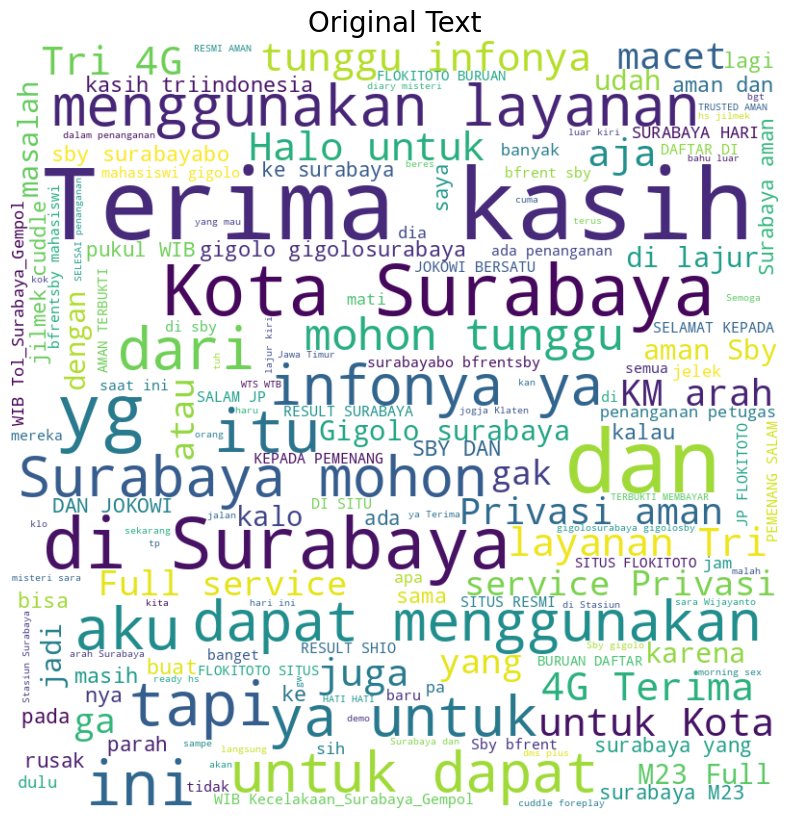

In [36]:
plt.figure(figsize=(10, 10))
wc_orig = WordCloud(
    width=800, height=800, 
    background_color='white', 
    min_font_size=10) \
.generate(text_original)

plt.imshow(wc_orig, interpolation='bilinear')
plt.title('Original Text', fontsize=20)
plt.axis("off")
plt.show()

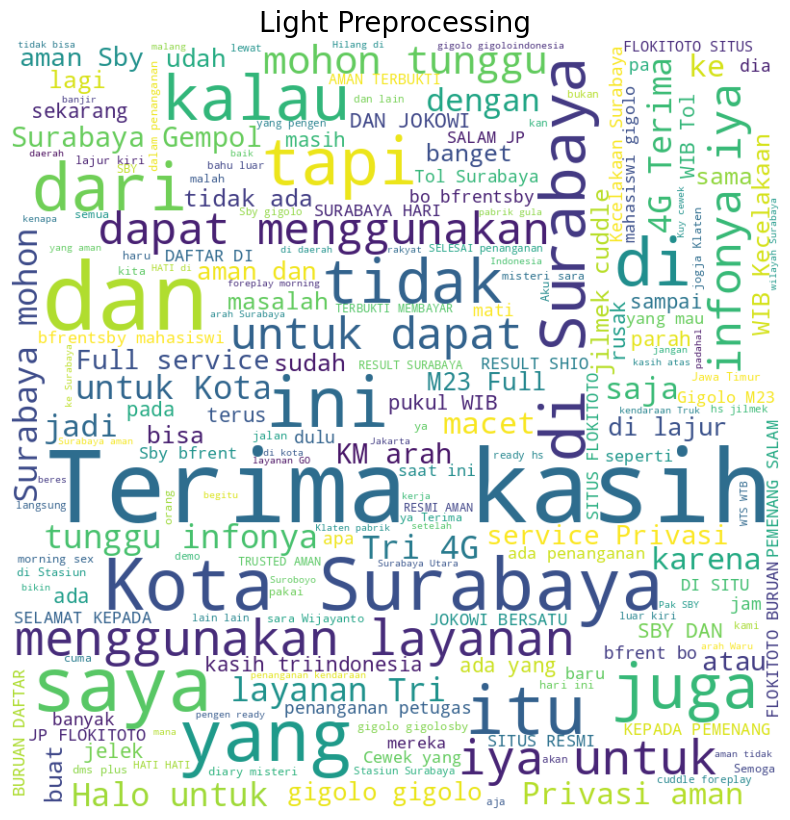

In [37]:
plt.figure(figsize=(10, 10))
wc_light = WordCloud(
    width=800, height=800, 
    background_color='white', 
    min_font_size=10) \
.generate(text_light)

plt.imshow(wc_light, interpolation='bilinear')
plt.title('Light Preprocessing', fontsize=20)
plt.axis("off")
plt.show()

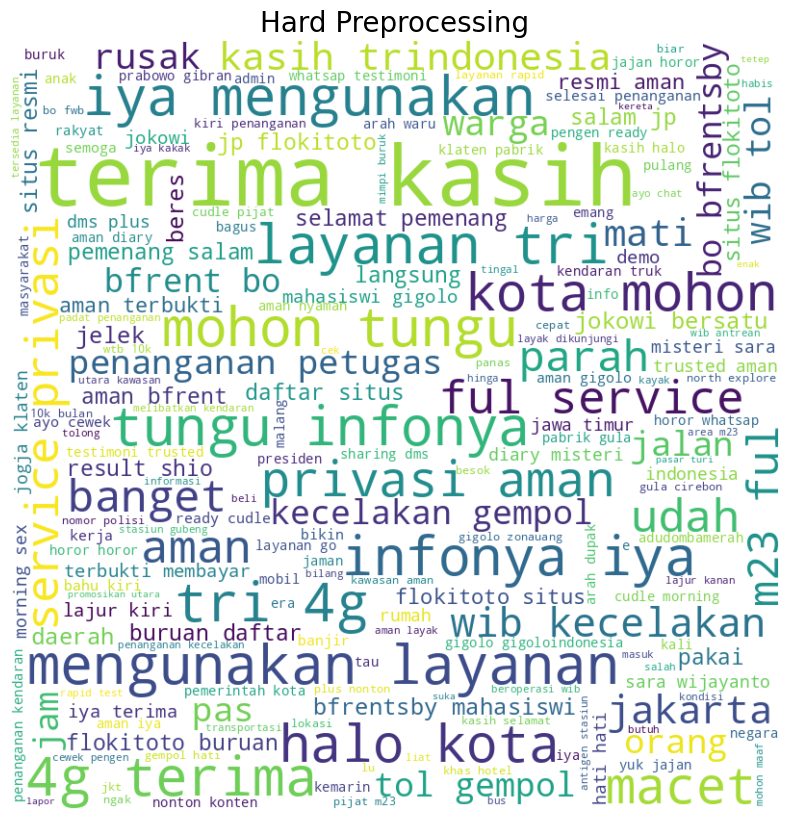

In [38]:
plt.figure(figsize=(10, 10))
wc_hard = WordCloud(
    width=800, height=800, 
    background_color='white', 
    min_font_size=10) \
.generate(text_hard)

plt.imshow(wc_hard, interpolation='bilinear')
plt.title('Hard Preprocessing', fontsize=20)
plt.axis("off")
plt.show()

# Feature Engineering

## FastText

In [39]:
text_model, vectors = text_pipeline(df['hard_processed_text'])
vectors.shape

2025-11-27 07:35:12,350 - INFO - Tokenizing text for FastText...
2025-11-27 07:35:12,375 - INFO - Number of CPU cores: 16
2025-11-27 07:35:12,375 - INFO - Training FastText model with vector_size=300...
2025-11-27 07:35:12,381 - INFO - collecting all words and their counts
2025-11-27 07:35:12,382 - INFO - PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2025-11-27 07:35:12,415 - INFO - PROGRESS: at sentence #10000, processed 168337 words, keeping 20760 word types
2025-11-27 07:35:12,417 - INFO - collected 20894 word types from a corpus of 174838 raw words and 10483 sentences
2025-11-27 07:35:12,418 - INFO - Creating a fresh vocabulary
2025-11-27 07:35:12,445 - INFO - FastText lifecycle event {'msg': 'effective_min_count=2 retains 10195 unique words (48.79% of original 20894, drops 10699)', 'datetime': '2025-11-27T07:35:12.444919', 'gensim': '4.3.3', 'python': '3.11.13 (main, Sep 15 2025, 15:36:35) [GCC 15.2.1 20250813]', 'platform': 'Linux-6.16.8-2-cachyos-x86_64-with-

(10483, 300)

In [40]:
reducer = UMAP(
    n_components=2,
    n_neighbors=15,
    min_dist=0.5,
    random_state=42,
    metric='cosine'
)

embedding = reducer.fit_transform(vectors)

/home/kiuyha/Documents/Surabaya-Opinion-Analytics/venv/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [41]:
plot_df = pd.DataFrame(embedding, columns=['UMAP_X', 'UMAP_Y'])
plot_df['Text_Snippet'] = df['text_content'].astype(str).str.slice(0, 100) + "..."
plot_df['Word_Count'] = df['WC_Hard']

# 2. Plot
fig = px.scatter(
    plot_df, 
    x='UMAP_X', 
    y='UMAP_Y',
    color='Word_Count',
    hover_data=['Text_Snippet'],
    color_continuous_scale='Viridis',
    title='2D UMAP Projection of FastText Vectors',
    opacity=0.7,
    render_mode='webgl'
)

fig.update_layout(
    template='plotly_white',
    coloraxis_colorbar=dict(title="Word Count")
)

fig.update_traces(marker=dict(opacity=0.6))

fig.show()

In [42]:
fig = px.density_heatmap(
    plot_df, 
    x='UMAP_X', 
    y='UMAP_Y', 
    nbinsx=150, 
    nbinsy=150, 
    title='Density Heatmap of Feature Space',
    color_continuous_scale='Magma'
)

fig.update_layout(template='plotly_white', height=600)
fig.show()

# Comparing Topics Models

In [22]:
def visualization_result(df, labels, vectors, keywords, junk_topics_id):
    sil_score = silhouette_score(vectors, labels)
    log.info(f"Silhouette score for optimal model: {sil_score:.2f}")

    # temporarily add the cluster label to the dataframe
    df['cluster_label'] = labels

    if junk_topics_id:
        log.info(f"Re-labeling junk topics {junk_topics_id} to -1...")
        df['cluster_label'] = df['cluster_label'].replace(junk_topics_id, -1)

    clean_keywords = [
        keyword_list for i, keyword_list in enumerate(keywords) 
        if i not in junk_topics_id
    ]

    log.info("Generating labels from top 10 keywords (no API)...")
    generated_labels = [
        ", ".join(keyword[:10])
        for keyword in clean_keywords
    ]
    for i, label in enumerate(generated_labels):
        log.info(f"Generated label for Topic #{i}: {label}")

    good_kmeans_labels = sorted([
        i 
        for i in df['cluster_label'].unique()
        if i != -1
    ])

    topic_labels_map = {
        label: name
        for label, name in zip(good_kmeans_labels, generated_labels)
    }

    return create_cluster_plot(df, vectors, topic_labels_map, save=False)

## K-Means

In [43]:
kmeans_model, keywords, labels, junk_topics_id = find_and_train_optimal_model(
    vectors,
    text_model,
    df['hard_processed_text'].to_list(),
    min_k=3,
    max_k=8
)

2025-11-27 07:35:36,823 - INFO - adding document #0 to Dictionary<0 unique tokens: []>
2025-11-27 07:35:36,971 - INFO - adding document #10000 to Dictionary<20760 unique tokens: ['cofe', 'flash', 'kasih', 'kinerja', 'kualitas']...>
2025-11-27 07:35:36,978 - INFO - built Dictionary<20894 unique tokens: ['cofe', 'flash', 'kasih', 'kinerja', 'kualitas']...> from 10483 documents (total 174838 corpus positions)
2025-11-27 07:35:36,979 - INFO - Dictionary lifecycle event {'msg': "built Dictionary<20894 unique tokens: ['cofe', 'flash', 'kasih', 'kinerja', 'kualitas']...> from 10483 documents (total 174838 corpus positions)", 'datetime': '2025-11-27T07:35:36.979760', 'gensim': '4.3.3', 'python': '3.11.13 (main, Sep 15 2025, 15:36:35) [GCC 15.2.1 20250813]', 'platform': 'Linux-6.16.8-2-cachyos-x86_64-with-glibc2.42', 'event': 'created'}
2025-11-27 07:35:37,159 - INFO - using ParallelWordOccurrenceAccumulator<processes=15, batch_size=64> to estimate probabilities from sliding windows
2025-11-27 

In [44]:
visualization_result(df, labels, vectors, keywords, junk_topics_id)

2025-11-27 07:36:28,348 - INFO - Silhouette score for optimal model: 0.37
2025-11-27 07:36:28,352 - INFO - Re-labeling junk topics [1] to -1...
2025-11-27 07:36:28,358 - INFO - Generating labels from top 10 keywords (no API)...
2025-11-27 07:36:28,358 - INFO - Generated label for Topic #0: aman, ready, cudle, m23, gigolo, privasi, ful, bfrent, service, mahasiswi
2025-11-27 07:36:28,359 - INFO - Generated label for Topic #1: layanan, terima, kasih, halo, iya, mohon, kota, mengunakan, tungu, 4g
2025-11-27 07:36:28,360 - INFO - Generated label for Topic #2: gempol, wib, arah, penanganan, kecelakan, lajur, kendaran, kiri, dupak, tol
2025-11-27 07:36:28,365 - INFO - Generating interactive scatter plot with named topics...
/home/kiuyha/Documents/Surabaya-Opinion-Analytics/venv/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

2025-11-27 07:36:35,581 - INFO - Creating Plotly figure...


## HDBScan

In [38]:
def find_and_train_optimal_hdbscan(
    vectors,
    text_model,
    original_texts,
    min_cluster_size_range= [5, 10, 15, 20, 30],
    abs_coherence_threshold = 0.45,
    rel_coherence_drop = 0.80
):
    all_results = []
    
    for min_size in min_cluster_size_range:
        # min_samples usually defaults to min_cluster_size, but can be tuned
        model = HDBSCAN(min_cluster_size=min_size, min_samples=None)
        labels = model.fit_predict(vectors)
        
        # Calculate number of actual clusters (excluding noise -1)
        num_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        
        if num_clusters < 2:
            log.info(f"HDBSCAN min_size={min_size} produced {num_clusters} clusters. Skipping.")
            continue

        # Extract keywords (ignoring noise label -1)
        keywords = get_keywords_from_labels(labels, original_texts, top_n=50, ignore_label=-1)
        
        top_10_keywords = [kw[:10] for kw in keywords]
        avg_coherence, individual_coherences = calculate_coherence_score(top_10_keywords, original_texts)
        separation_score = calculate_separation_score(keywords, text_model)
        
        final_score = (avg_coherence * 0.6) + (separation_score * 0.4)
        
        log.info(f"Min_Size={min_size} (Clusters={num_clusters}): Coherence: {avg_coherence:.4f}, Separation: {separation_score:.4f}")

        all_results.append({
            'min_size': min_size,
            'model': model,
            'labels': labels,
            'keywords': keywords,
            'final_score': final_score,
            'avg_coherence': avg_coherence,
            'separation_score': separation_score,
            'individual_scores': individual_coherences
        })

    if not all_results:
        log.error("HDBSCAN failed to find a valid clustering configuration.")
        return None, [], np.array([]), []

    best_result = max(all_results, key=lambda x: x['final_score'])
    log.info(f"Best HDBSCAN: Min_Size={best_result['min_size']}, Final Score: {best_result['final_score']:.4f}")

    # Determine Junk Topics
    best_individual_scores = best_result['individual_scores']
    median_score = np.median(best_individual_scores) if best_individual_scores else 0
    relative_threshold = median_score * rel_coherence_drop
    
    junk_topic_ids = [
        i for i, score in enumerate(best_individual_scores) 
        if score < abs_coherence_threshold or score < relative_threshold
    ]

    return best_result['model'], best_result['keywords'], best_result['labels'], junk_topic_ids

In [39]:
hdbscan_model, keywords, labels, junk_topics_id = find_and_train_optimal_hdbscan(
    vectors,
    text_model,
    df['hard_processed_text'].to_list(),
)

2025-11-23 17:46:19,384 - INFO - adding document #0 to Dictionary<0 unique tokens: []>
2025-11-23 17:46:19,534 - INFO - adding document #10000 to Dictionary<20692 unique tokens: ['cofe', 'flash', 'kasih', 'kinerja', 'kualitas']...>
2025-11-23 17:46:19,540 - INFO - built Dictionary<20821 unique tokens: ['cofe', 'flash', 'kasih', 'kinerja', 'kualitas']...> from 10440 documents (total 174226 corpus positions)
2025-11-23 17:46:19,541 - INFO - Dictionary lifecycle event {'msg': "built Dictionary<20821 unique tokens: ['cofe', 'flash', 'kasih', 'kinerja', 'kualitas']...> from 10440 documents (total 174226 corpus positions)", 'datetime': '2025-11-23T17:46:19.541225', 'gensim': '4.3.3', 'python': '3.11.13 (main, Sep 15 2025, 15:36:35) [GCC 15.2.1 20250813]', 'platform': 'Linux-6.16.8-2-cachyos-x86_64-with-glibc2.42', 'event': 'created'}
2025-11-23 17:46:20,179 - INFO - using ParallelWordOccurrenceAccumulator<processes=15, batch_size=64> to estimate probabilities from sliding windows
2025-11-23 

In [40]:
visualization_result(df, labels, vectors, keywords, junk_topics_id)

2025-11-23 17:58:33,591 - INFO - Silhouette score for optimal model: -0.33
2025-11-23 17:58:33,606 - INFO - Re-labeling junk topics [16, 42] to -1...
2025-11-23 17:58:33,614 - INFO - Generating labels from top 10 keywords (no API)...
2025-11-23 17:58:33,615 - INFO - Generated label for Topic #0: flokitoto, result, situs, shio, membayar, salam, pemenang, terbukti, buruan, selamat
2025-11-23 17:58:33,615 - INFO - Generated label for Topic #1: ready, 1bulan, ch, anabele, biru, akses, kuning, zonajajan, trusted, plus
2025-11-23 17:58:33,616 - INFO - Generated label for Topic #2: ready, ch, 1bulan, anabele, akses, kuning, pabrik, biru, gula, plus
2025-11-23 17:58:33,616 - INFO - Generated label for Topic #3: horor, jajan, whatsap, testimoni, wtb, konten, yuk, bulan, nonton, pabrik
2025-11-23 17:58:33,616 - INFO - Generated label for Topic #4: nonton, horor, pagi, yuk, jajan, whatsap, bulan, testimoni, konten, wtb
2025-11-23 17:58:33,617 - INFO - Generated label for Topic #5: hut, khas, nort

## Gaussian Mixture

In [30]:
def find_and_train_optimal_gmm(
    vectors,
    text_model,
    original_texts,
    min_k = 2,
    max_k = 15,
    abs_coherence_threshold = 0.45,
    rel_coherence_drop = 0.80
):

    all_results = []
    k_range = range(min_k, max_k + 1)
    
    for k in k_range:
        gmm = GaussianMixture(n_components=k, random_state=42, n_init=2)
        labels = gmm.fit_predict(vectors)
        
        keywords = get_keywords_from_labels(labels, original_texts, top_n=50)
        
        top_10_keywords = [kw[:10] for kw in keywords]
        avg_coherence, individual_coherences = calculate_coherence_score(top_10_keywords, original_texts)
        separation_score = calculate_separation_score(keywords, text_model)
        
        final_score = (avg_coherence * 0.6) + (separation_score * 0.4)
        
        log.info(f"GMM K={k}: Coherence: {avg_coherence:.4f}, Separation: {separation_score:.4f}")

        all_results.append({
            'k': k,
            'model': gmm,
            'labels': labels,
            'keywords': keywords,
            'final_score': final_score,
            'individual_scores': individual_coherences
        })

    best_result = max(all_results, key=lambda x: x['final_score'])
    log.info(f"Best GMM K={best_result['k']}, Final Score: {best_result['final_score']:.4f}")

    # Junk Topic Logic
    best_individual_scores = best_result['individual_scores']
    median_score = np.median(best_individual_scores)
    relative_threshold = median_score * rel_coherence_drop
    
    junk_topic_ids = [
        i for i, score in enumerate(best_individual_scores) 
        if score < abs_coherence_threshold or score < relative_threshold
    ]

    return best_result['model'], best_result['keywords'], best_result['labels'], junk_topic_ids

In [31]:
gmm_model, keywords, labels, junk_topics_id = find_and_train_optimal_gmm(
    vectors,
    text_model,
    df['hard_processed_text'].to_list(),
    min_k=3,
    max_k=8,
)

2025-11-23 17:39:14,071 - INFO - adding document #0 to Dictionary<0 unique tokens: []>
2025-11-23 17:39:14,235 - INFO - adding document #10000 to Dictionary<20692 unique tokens: ['cofe', 'flash', 'kasih', 'kinerja', 'kualitas']...>
2025-11-23 17:39:14,241 - INFO - built Dictionary<20821 unique tokens: ['cofe', 'flash', 'kasih', 'kinerja', 'kualitas']...> from 10440 documents (total 174226 corpus positions)
2025-11-23 17:39:14,242 - INFO - Dictionary lifecycle event {'msg': "built Dictionary<20821 unique tokens: ['cofe', 'flash', 'kasih', 'kinerja', 'kualitas']...> from 10440 documents (total 174226 corpus positions)", 'datetime': '2025-11-23T17:39:14.242171', 'gensim': '4.3.3', 'python': '3.11.13 (main, Sep 15 2025, 15:36:35) [GCC 15.2.1 20250813]', 'platform': 'Linux-6.16.8-2-cachyos-x86_64-with-glibc2.42', 'event': 'created'}
2025-11-23 17:39:14,355 - INFO - using ParallelWordOccurrenceAccumulator<processes=15, batch_size=64> to estimate probabilities from sliding windows
2025-11-23 

In [32]:
visualization_result(df, labels, vectors, keywords, junk_topics_id)

2025-11-23 17:42:22,809 - INFO - Silhouette score for optimal model: 0.18
2025-11-23 17:42:22,814 - INFO - Re-labeling junk topics [3] to -1...
2025-11-23 17:42:22,820 - INFO - Generating labels from top 10 keywords (no API)...
2025-11-23 17:42:22,821 - INFO - Generated label for Topic #0: layanan, terima, kasih, iya, aman, kota, tri, mohon, halo, infonya
2025-11-23 17:42:22,821 - INFO - Generated label for Topic #1: aman, cudle, m23, gigolo, privasi, ready, bfrent, service, mahasiswi, bfrentsby
2025-11-23 17:42:22,822 - INFO - Generated label for Topic #2: gempol, penanganan, wib, lajur, kecelakan, arah, kendaran, macet, dupak, kiri
2025-11-23 17:42:22,828 - INFO - Generating interactive scatter plot with named topics...
/home/kiuyha/Documents/Surabaya-Opinion-Analytics/venv/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

2025-11-23 17:42:29,619 - INFO - Creating Plotly figure...


## LDA

In [ ]:
def find_and_train_optimal_lda(
    original_texts,
    min_k: int = 2,
    max_k: int = 15,
    abs_coherence_threshold = 0.45,
    rel_coherence_drop = 0.80
):
    # Preprocess for LDA (BoW)
    tokenized_texts = [doc.split() for doc in original_texts]
    dictionary = Dictionary(tokenized_texts)

    # Filter extremes to remove too rare/common words
    dictionary.filter_extremes(no_below=5, no_above=0.5) 
    corpus = [dictionary.doc2bow(text) for text in tokenized_texts]

    all_results = []
    k_range = range(min_k, max_k + 1)

    for k in k_range:
        lda_model = LdaMulticore(
            corpus=corpus,
            id2word=dictionary,
            num_topics=k,
            random_state=42,
            passes=10,
            workers=2
        )
        
        # Extract Keywords directly from LDA
        keywords = []
        for topic_id in range(k):
            terms = lda_model.get_topic_terms(topic_id, topn=50)
            topic_words = [dictionary[w_id] for w_id, _ in terms]
            keywords.append(topic_words)

        top_10_keywords = [kw[:10] for kw in keywords]
        avg_coherence, individual_coherences = calculate_coherence_score(top_10_keywords, original_texts)
        
        separation_score = calculate_separation_score(keywords, text_model)
        
        final_score = (avg_coherence * 0.6) + (separation_score * 0.4)
        log.info(f"LDA K={k}: Coherence: {avg_coherence:.4f}, Separation: {separation_score:.4f}")

        # Generate "Labels" (Dominant topic per document)
        doc_labels = []
        for doc_bow in corpus:
            topic_probs = lda_model.get_document_topics(doc_bow)
            if topic_probs:
                dominant_topic = max(topic_probs, key=lambda x: x[1])[0]
                doc_labels.append(dominant_topic)
            else:
                doc_labels.append(0)

        all_results.append({
            'k': k,
            'model': lda_model,
            'labels': np.array(doc_labels),
            'keywords': keywords,
            'final_score': final_score,
            'individual_scores': individual_coherences
        })

    best_result = max(all_results, key=lambda x: x['final_score'])
    log.info(f"Best LDA K={best_result['k']}, Final Score: {best_result['final_score']:.4f}")

    # Junk Topic Logic
    best_individual_scores = best_result['individual_scores']
    median_score = np.median(best_individual_scores)
    relative_threshold = median_score * rel_coherence_drop
    
    junk_topic_ids = [
        i for i, score in enumerate(best_individual_scores) 
        if score < abs_coherence_threshold or score < relative_threshold
    ]

    return best_result['model'], best_result['keywords'], best_result['labels'], junk_topic_ids

In [36]:
lda_model, keywords, labels, junk_topics_id = find_and_train_optimal_lda(
    df['hard_processed_text'].to_list(),
    min_k=3,
    max_k=8,
)

2025-11-23 17:43:46,099 - INFO - adding document #0 to Dictionary<0 unique tokens: []>
2025-11-23 17:43:46,268 - INFO - adding document #10000 to Dictionary<20692 unique tokens: ['cofe', 'flash', 'kasih', 'kinerja', 'kualitas']...>
2025-11-23 17:43:46,274 - INFO - built Dictionary<20821 unique tokens: ['cofe', 'flash', 'kasih', 'kinerja', 'kualitas']...> from 10440 documents (total 174226 corpus positions)
2025-11-23 17:43:46,274 - INFO - Dictionary lifecycle event {'msg': "built Dictionary<20821 unique tokens: ['cofe', 'flash', 'kasih', 'kinerja', 'kualitas']...> from 10440 documents (total 174226 corpus positions)", 'datetime': '2025-11-23T17:43:46.274802', 'gensim': '4.3.3', 'python': '3.11.13 (main, Sep 15 2025, 15:36:35) [GCC 15.2.1 20250813]', 'platform': 'Linux-6.16.8-2-cachyos-x86_64-with-glibc2.42', 'event': 'created'}
2025-11-23 17:43:46,287 - INFO - discarding 16503 tokens: [('cofe', 4), ('menyempurnakan', 1), ('aktifitas', 4), ('grandcity', 2), ('kustomernya', 1), ('mybca',

In [37]:
visualization_result(df, labels, vectors, keywords, junk_topics_id)

2025-11-23 17:45:43,312 - INFO - Silhouette score for optimal model: 0.10
2025-11-23 17:45:43,314 - INFO - Re-labeling junk topics [3] to -1...
2025-11-23 17:45:43,316 - INFO - Generating labels from top 10 keywords (no API)...
2025-11-23 17:45:43,317 - INFO - Generated label for Topic #0: terima, kasih, layanan, iya, kota, halo, mohon, mengunakan, tungu, infonya
2025-11-23 17:45:43,317 - INFO - Generated label for Topic #1: aman, privasi, ful, service, mati, cudle, ayo, mahasiswi, gigolo, m23
2025-11-23 17:45:43,317 - INFO - Generated label for Topic #2: arah, penanganan, wib, gempol, macet, jokowi, kendaran, kecelakan, hati, kiri
2025-11-23 17:45:43,318 - INFO - Generating interactive scatter plot with named topics...
/home/kiuyha/Documents/Surabaya-Opinion-Analytics/venv/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

2025-11-23 17:45:50,206 - INFO - Creating Plotly figure...
